# San Francisco Parking Exploratory Data Analysis
this notebook is for the initial exploration and combination of data gathered for the San Francisco Parking Project.As it stands, there are three data sources:

1. Ticket Data
2. Adress Data
3. Street Data

To see how these three tables were created, see the create_db notebook series. We'll first wuery the data to see how much data is missing, and then we do some exploratory analysis. 



In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import itertools
import datetime as dt
import time
from scipy import stats
import geopandas as gpd
import folium
import sqlite3
import seaborn as sns
import statsmodels.formula as sm
%matplotlib inline

/home/colin/.local/lib/python3.6/site-packages/requests/__init__.py:91: RequestsDependencyWarning: urllib3 (1.24) or chardet (3.0.4) doesn't match a supported version!
  RequestsDependencyWarning)


In [2]:
def result_query(querystring):
    resultdf = pd.read_sql(sql= querystring, con = conn)
    
    return resultdf

In [3]:
raw_folder = '/home/colin/Desktop/SF_Parking/data/raw/'
proc_folder = '/home/colin/Desktop/SF_Parking/data/processed/'

In [4]:
conn = sqlite3.connect(proc_folder + 'SF_Parking.db')
c = conn.cursor()
tables = result_query("SELECT name FROM sqlite_master where type = 'table'")
tables

,name
0,raw_ticket_data
1,raw_address_data
2,single_address
3,ticket_data
4,street_sweep_data
5,address_data
6,street_volume_data


In [5]:
ticket_data = pd.read_sql_query("Select  * from ticket_data " ,con = conn, parse_dates = ['TickIssueDate'])
address_data = result_query('Select * from address_data')
agencies = pd.read_csv(raw_folder +'SF_Agency_List.csv')
c.execute('Select Max(TickIssueDate), Min(TickIssueDate) from ticket_data')
totaldays = c.fetchone()
maxdate = time.strptime( totaldays[0], '%Y-%m-%d %H:%M:%S')
mindate = time.strptime( totaldays[1], '%Y-%m-%d %H:%M:%S')
totaldays = (time.mktime(maxdate) - time.mktime(mindate)) / (60*60*24)
totalyears = totaldays /365

In [6]:
missed = result_query('Select t1.* from raw_ticket_data t1 left join ticket_data t2 on t1.ticketnumber= t2.ticketnumber'
                     ' where t2.ticketnumber is null')

Text(0.5, 1.0, 'Total Tickets by Violation Type')

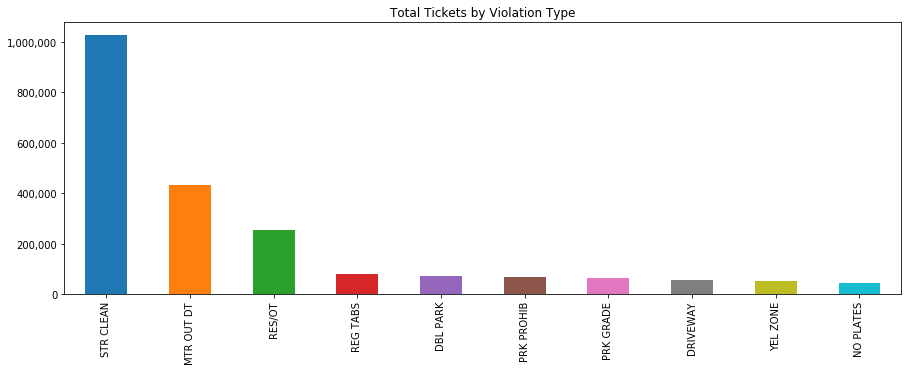

In [7]:
#Most common ticket types
ax = ticket_data['ViolationDesc'].value_counts().nlargest(10).plot(kind = 'bar', figsize = (15,5))
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.set_title('Total Tickets by Violation Type')

Text(0.5, 1.0, 'Total Tickets by Vehicle Make')

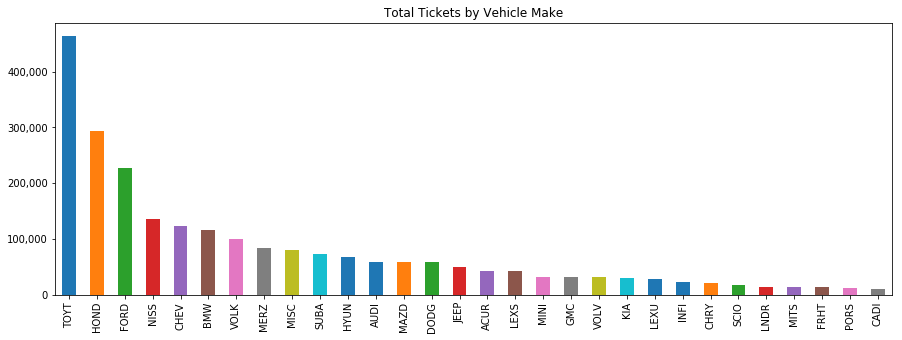

In [8]:
#Most common vehicle types
ax = ticket_data['VehMake'].value_counts().nlargest(30).plot(kind = 'bar', figsize = (15,5))
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.set_title('Total Tickets by Vehicle Make')

In [9]:
ticket_data = ticket_data.merge(address_data, left_on = 'address', right_on = 'address')

# Initial Exploration
Lets look for some relationships

Text(0.5, 1.0, 'Total Tickets by Neighborhood')

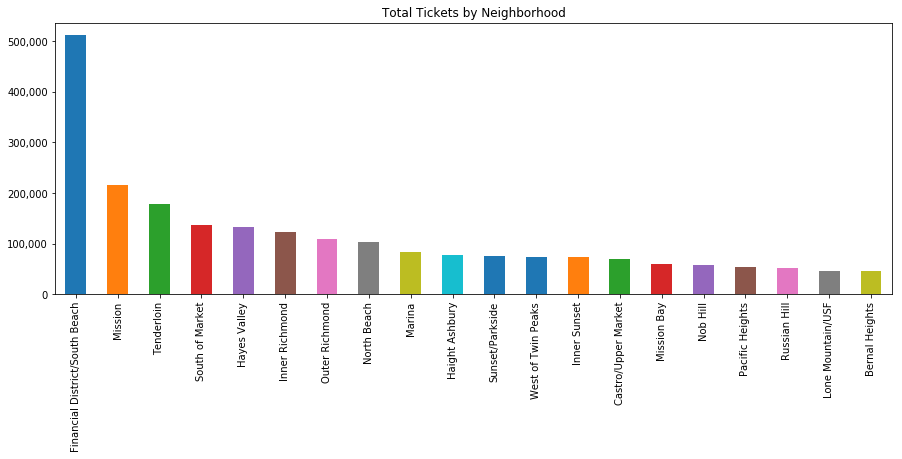

In [10]:
#Total tickets by neighborhood
ax = ticket_data['nhood'].value_counts().nlargest(20).plot(kind = 'bar', figsize = (15,5))
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.set_title('Total Tickets by Neighborhood')

Text(0.5, 1.0, 'Total Tickets by Hour of Day, by Ticket Type')

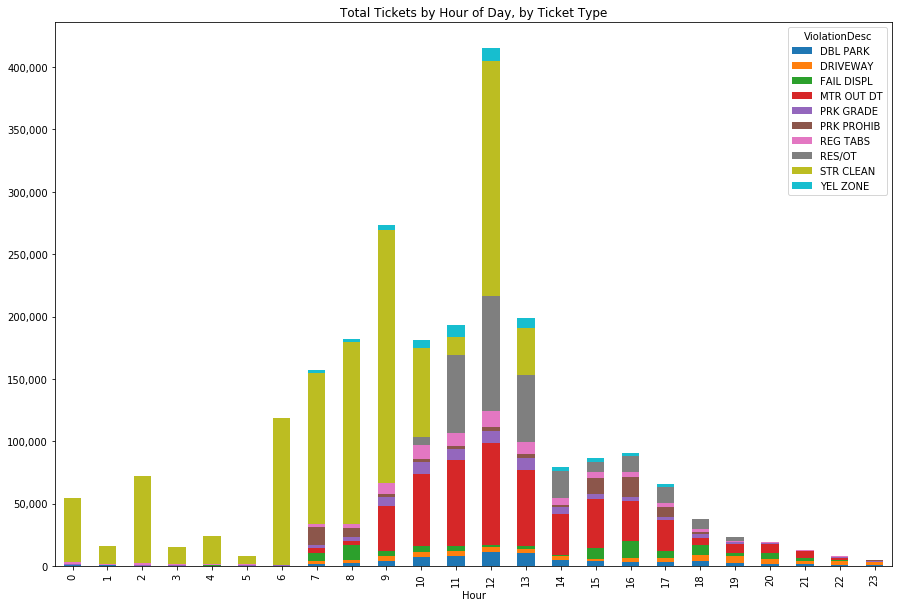

In [11]:
#Types of Tickets by hour
ticket_data['Hour'] = ticket_data['TickIssueDate'].apply(lambda x: pd.to_datetime(x).hour)
type_by_hour = ticket_data[ticket_data['ViolationDesc'].isin(ticket_data['ViolationDesc'].value_counts()[:10].index.tolist())]
pivot_df = type_by_hour.groupby(['Hour', 'ViolationDesc'])['Hour'].count().unstack('ViolationDesc').fillna(0)
ax = pivot_df.plot(kind = 'bar', figsize = (15, 10), stacked = True)
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.set_title('Total Tickets by Hour of Day, by Ticket Type')

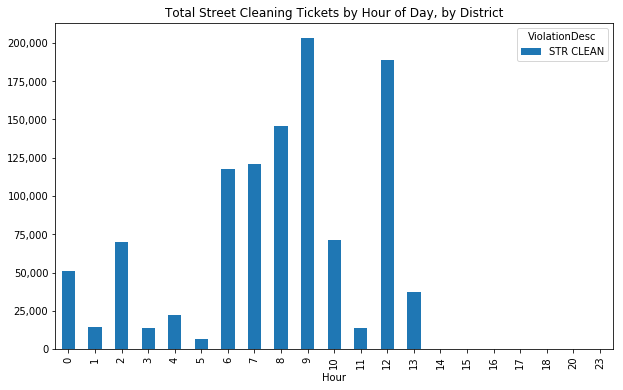

In [12]:
#Street cleaning by hour only
type_by_hour = ticket_data[ticket_data['ViolationDesc'] == 'STR CLEAN']
pivot_df = type_by_hour.groupby(['Hour', 'ViolationDesc'])['Hour'].count().unstack('ViolationDesc').fillna(0)
ax = pivot_df.plot(kind = 'bar', figsize = (10, 6), stacked = True)
ax.set_title('Total Street Cleaning Tickets by Hour of Day, by District')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))

Looks like late night street cleaning is a major culrpit, lets look at the by hour by neighborhood(Top 10)

Text(0.5, 1.0, 'Total Tickets by Hour of Day, Split by Neighborhood')

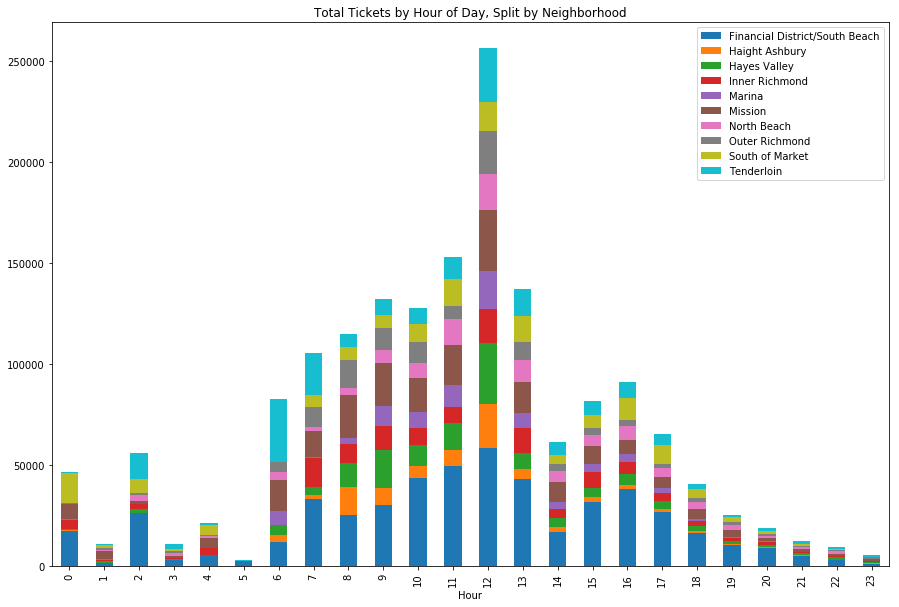

In [13]:
#Tickets by Nhood
ticket_data = ticket_data[ticket_data['nhood'] !='Unkown']
type_by_hood = ticket_data[ticket_data['nhood'].isin(ticket_data['nhood'].value_counts()[:10].index.tolist())]
pivot_df = type_by_hood.groupby(['Hour', 'nhood'])['Hour'].count().unstack('nhood').fillna(0)
pivot_df.plot(kind = 'bar', figsize = (15, 10), stacked = True)
plt.legend(loc = 1)
plt.title('Total Tickets by Hour of Day, Split by Neighborhood')

Lets look at types of tickets by Day of Week

In [14]:
#Types of Tickets by day of week
ticket_data['Weekday'] = ticket_data['TickIssueDate'].apply(lambda x: x.weekday())
type_by_dow = ticket_data[ticket_data['ViolationDesc'].isin(ticket_data['ViolationDesc'].value_counts()[:10].index.tolist())]
pivot_df = type_by_dow.groupby(['Weekday', 'ViolationDesc'])['Weekday'].count().unstack('ViolationDesc').fillna(0).reset_index()

Text(0.5, 1.0, 'Total Tickets by Day, By Ticket Type')

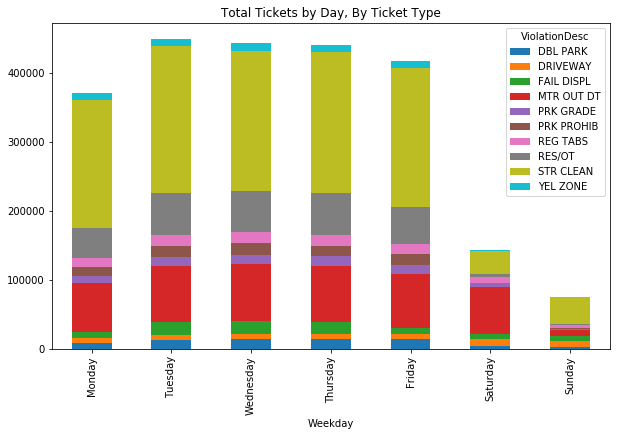

In [15]:
days = {6:'Sunday', 0:'Monday', 1:'Tuesday', 2:'Wednesday', 3:'Thursday', 4:'Friday', 5:'Saturday'}
pivot_df['Weekday'] = pivot_df['Weekday'].map(days)
pivot_df.plot( x= 'Weekday', kind = 'bar', figsize = (10, 6), stacked = True)
plt.title('Total Tickets by Day, By Ticket Type')

Lets look at proportions by district

Text(0.5, 1.0, 'Percent Share of Ticket Type by Neighborhood')

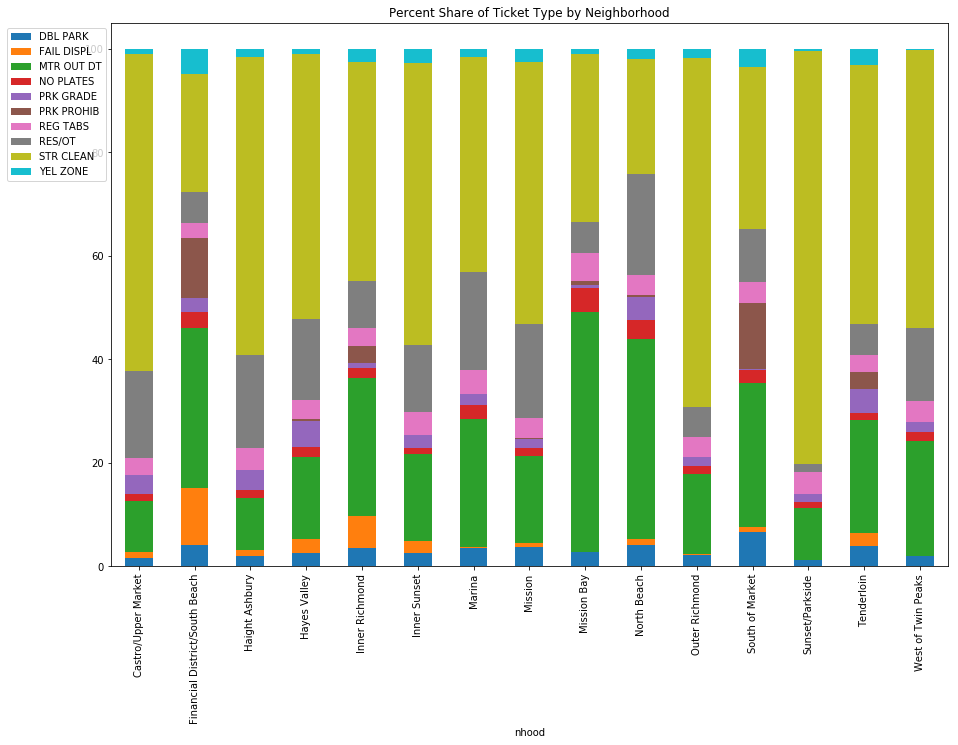

In [16]:
#only look at top 15 neighgborhoood, top 10 ticket types
df = ticket_data[ticket_data['nhood'].isin(ticket_data['nhood'].value_counts()[:15].index)]
df = df[df['ViolationDesc'].isin(df['ViolationDesc'].value_counts()[:10].index)]
total_tickets_by_hood = df.groupby(['nhood', 'ViolationDesc'])['index_x'].count()
by_nhood = df.groupby(['nhood', 'ViolationDesc'])['index_x'].count()
nhood_pct = by_nhood.groupby(level=0).apply(lambda x: 100 * x / float(x.sum())).unstack('ViolationDesc').fillna(0)
nhood_pct.plot(kind = 'bar', stacked = True, figsize = (15, 10))
plt.legend(bbox_to_anchor = (0, 1))
plt.title('Percent Share of Ticket Type by Neighborhood')

Text(0.5, 1.0, 'Percent Share of Tickets by Vehicle Make, by Neighborhood')

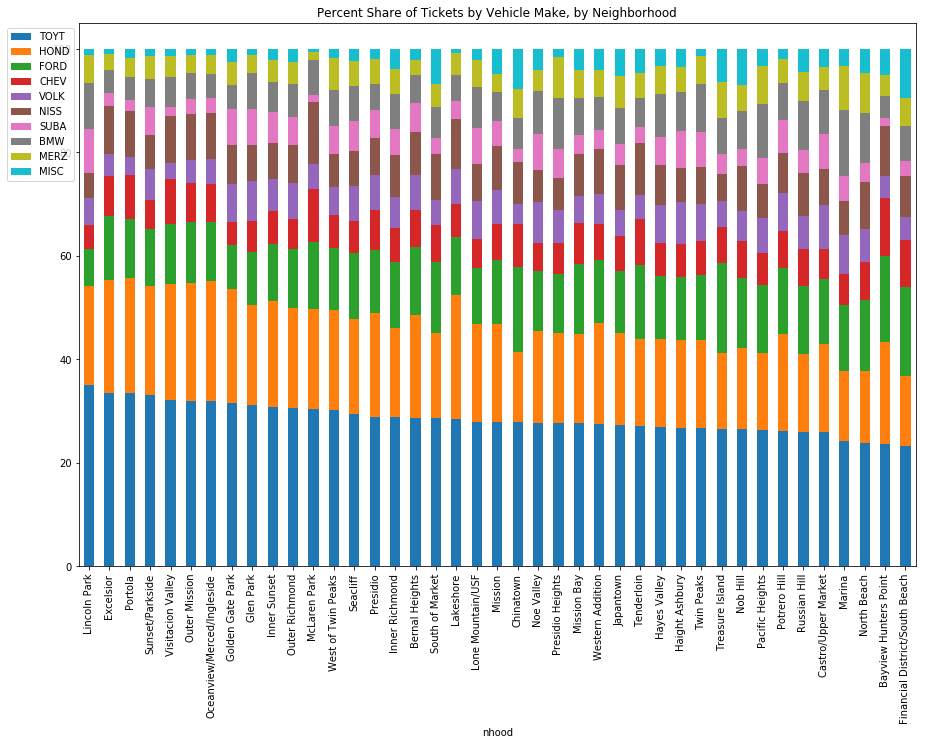

In [17]:
#Look at neighborhoods top car types, sort by least toyota
df = ticket_data[ticket_data['VehMake'].isin(ticket_data['VehMake'].value_counts()[:10].index)]
by_car = df.groupby(['nhood', 'VehMake'])['index_x'].count()
by_car_pct = by_car.groupby(level=0).apply(lambda x: 100 * x / float(x.sum())).unstack('VehMake').fillna(0)
cols = ['TOYT', 'HOND', 'FORD', 'CHEV', 'VOLK', 'NISS', 'SUBA', 'BMW', 'MERZ', 'MISC']
by_car_pct = by_car_pct[cols]
by_car_pct.sort_values(by = 'TOYT', ascending = False, inplace = True)
by_car_pct.plot(kind = 'bar', stacked = True, figsize = (15, 10))
plt.legend(bbox_to_anchor = (0, 1))
plt.title('Percent Share of Tickets by Vehicle Make, by Neighborhood')

Text(0.5, 1.0, 'Share of ticket type by Vehicle Make')

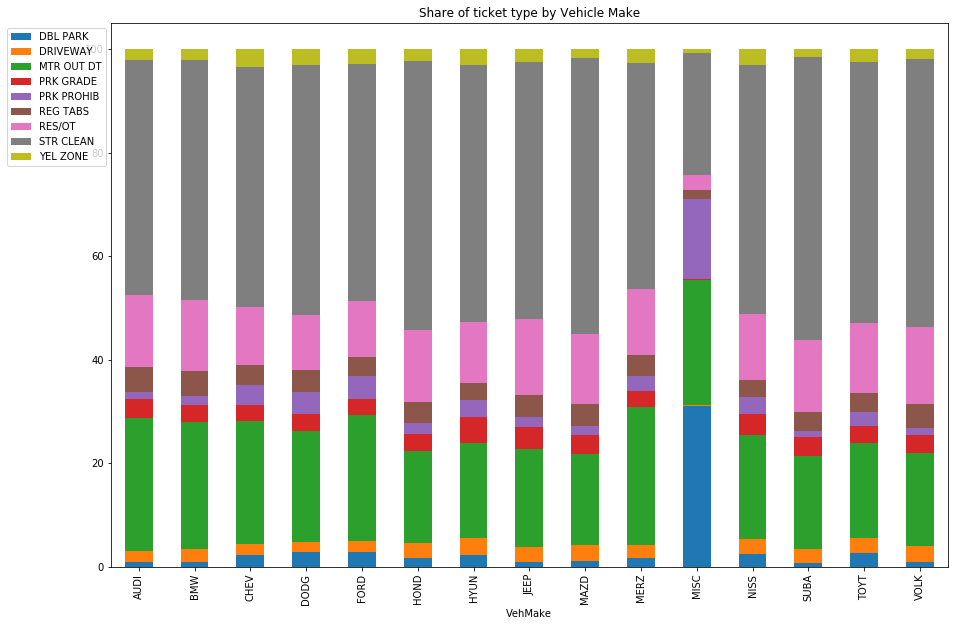

In [18]:
#only look at top 15 car makes, top ticket type
df = ticket_data[ticket_data['ViolationDesc'].isin(ticket_data['ViolationDesc'].value_counts()[:10].index)]
df = df[df['VehMake'].isin(ticket_data['VehMake'].value_counts()[:15].index)]
by_car = df.groupby(['VehMake', 'ViolationDesc'])['index_x'].count()
car_pct = by_car.groupby(level=0).apply(lambda x: 100 * x / float(x.sum())).unstack('ViolationDesc').fillna(0)
car_pct.plot(kind = 'bar', stacked = True, figsize = (15, 10))
plt.legend(bbox_to_anchor = (0, 1))
plt.title('Share of ticket type by Vehicle Make')

Miscellaneous is most likely trucks, as they would get ticketed for double parking more frequently

In [19]:
ticket_data.head()

,index_x,TicketNumber,TickIssueDate,TickIssueTime,ViolationDesc,VehMake,TickRPPlate,TickStreetNo,TickMeter,Agency,...,index_y,lat,lon,lineid,nhood,number,street,streetname,Hour,Weekday
0,0,870546261,2016-07-01 11:37:00,11:37,YEL ZONE,TOYT,6SBL397,721,35907210.0,19.0,...,2537292,37.794255,-122.405114,41407.0,Chinatown,721,CLAY ST,CLAY,11,4
1,1,870450711,2016-07-18 15:25:00,15:25,PRK PROHIB,GMC,4ENB173,721,None,19.0,...,2537292,37.794255,-122.405114,41407.0,Chinatown,721,CLAY ST,CLAY,15,0
2,2,871982075,2016-08-12 13:14:00,13:14,MTR OUT DT,MISC,81534G1,721,35907210.0,19.0,...,2537292,37.794255,-122.405114,41407.0,Chinatown,721,CLAY ST,CLAY,13,4
3,3,871437475,2016-08-24 12:45:00,12:45,MTR OUT DT,MISC,81534G1,721,35907210.0,19.0,...,2537292,37.794255,-122.405114,41407.0,Chinatown,721,CLAY ST,CLAY,12,2
4,4,872117260,2016-08-26 15:35:00,15:35,PRK PROHIB,CHRY,7RNX392,721,None,19.0,...,2537292,37.794255,-122.405114,41407.0,Chinatown,721,CLAY ST,CLAY,15,4


In [20]:
ticket_data['Agency'] =ticket_data['Agency'].apply(lambda x: None if x!= x  else int(x))
agencies.columns = ['id', 'name']

In [21]:
#tickets by agency
tix_data = ticket_data.merge(agencies, left_on = 'Agency', right_on = 'id')

Text(0.5, 1.0, 'Percent Share of Ticket Type by Issueing Agency')

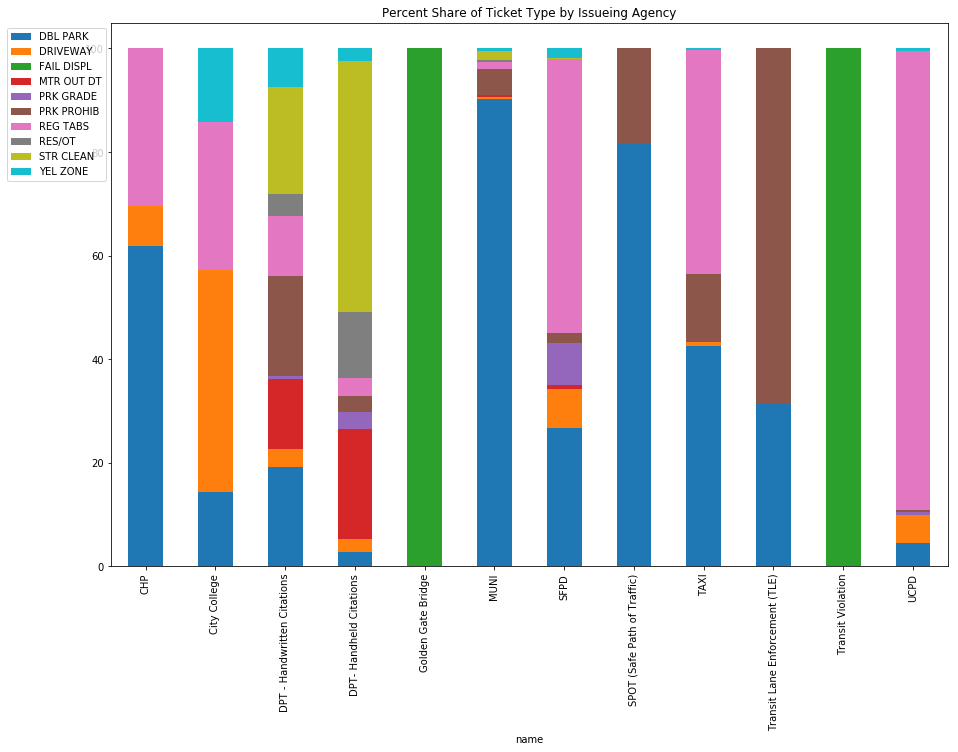

In [22]:
df = tix_data[tix_data['ViolationDesc'].isin(tix_data['ViolationDesc'].value_counts()[:10].index)]
by_agency = df.groupby(['name', 'ViolationDesc'])['index_x'].count()
tick_pct = by_agency.groupby(level=0).apply(lambda x: 100 * x / float(x.sum())).unstack('ViolationDesc').fillna(0)
tick_pct.plot(kind = 'bar', stacked = True, figsize = (15, 10))
plt.legend(bbox_to_anchor = (0, 1))
plt.title('Percent Share of Ticket Type by Issueing Agency')

The muni takes photos of people that are blocking it and sends automated tickets. I'm a frequent conversant with my Uber/Lyft Drivers, and I hear a lot of them complaining about getting more double parking tickets directly from the Buses. Let's see if thats substantiated. 

Text(0.5, 1.0, 'Double Parking Given by MUNI By Month')

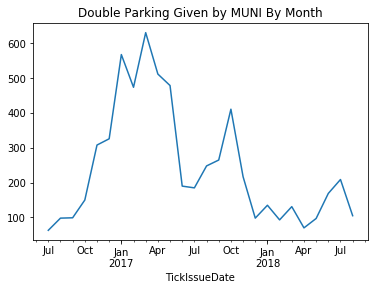

In [23]:
df = tix_data[(tix_data.ViolationDesc == 'DBL PARK') & (tix_data.name == 'MUNI')].set_index('TickIssueDate')
df = df.groupby(pd.Grouper(freq = 'm'))['TicketNumber'].count()
df.plot()
plt.title('Double Parking Given by MUNI By Month')

Would appear not so. 

# Map The Data


In [24]:
import folium
from folium import plugins

In [25]:
ticket_data.dtypes
ticket_data.shape

(2779996, 25)

First, lets look at what really is the inspiration behind this project.

In [26]:
my_tickets = result_query("Select * from ticket_data where TickRPPlate = '7XCS244'")
my_tickets

,index,TicketNumber,TickIssueDate,TickIssueTime,ViolationDesc,VehMake,TickRPPlate,TickStreetNo,TickMeter,Agency,TickBadgeIssued,TickStreetName,TotalPaid,TotalAmtDue,address
0,255261,884104955,2017-07-18 10:31:00,10:31,MTR OUT DT,CHEV,7XCS244,65,36106050.0,19.0,228,CLAYTON,73,,65 CLAYTON ST
1,429025,891851984,2017-12-20 14:43:00,14:43,RES/OT,CHEV,7XCS244,158,None,19.0,119,WALLER,116,,158 WALLER ST
2,179408,896220684,2018-04-26 15:14:00,15:14,MTR OUT DT,CHEV,7XCS244,1624,46216240.0,19.0,000322,HAIGHT,148,,1624 HAIGHT ST
3,245260,893925082,2018-02-15 11:48:00,11:48,RES/OT,CHEV,7XCS244,169,None,19.0,000034,WALLER,84,,169 WALLER ST
4,301097,894568732,2018-02-26 08:37:00,08:37,STR CLEAN,CHEV,7XCS244,1275,None,19.0,000086,WALLER,73,,1275 WALLER ST
5,360677,896508211,2018-04-19 09:31:00,09:31,NO PLATES,CHEV,7XCS244,63,None,19.0,000228,CLAYTON,1,,63 CLAYTON ST
6,373009,894391890,2018-03-08 11:43:00,11:43,RES/OT,CHEV,7XCS244,687,None,19.0,000034,CLAYTON,84,,687 CLAYTON ST
7,3647,900855922,2018-08-20 07:17:00,07:17,STR CLEAN,CHEV,7XCS244,132,None,19.0,000384,CALIFORNIA,0,76,132 CALIFORNIA ST
8,332903,920134515,2018-08-14 14:04:00,14:04,RES/OT,CHEV,7XCS244,1326,None,19.0,000259,CALIFORNIA,0,87,1326 CALIFORNIA ST
9,332904,900926526,2018-08-16 14:45:00,14:45,RES/OT,CHEV,7XCS244,1326,None,19.0,000259,CALIFORNIA,0,87,1326 CALIFORNIA ST


In [27]:
#NEED ADDRESS FULL
my_tickets.head()
my_tickets = my_tickets.merge(address_data, left_on = 'address', right_on = 'address')
my_tickets

,index_x,TicketNumber,TickIssueDate,TickIssueTime,ViolationDesc,VehMake,TickRPPlate,TickStreetNo,TickMeter,Agency,...,TotalAmtDue,address,index_y,lat,lon,lineid,nhood,number,street,streetname
0,255261,884104955,2017-07-18 10:31:00,10:31,MTR OUT DT,CHEV,7XCS244,65,36106050.0,19.0,...,,65 CLAYTON ST,1267784,37.774675,-122.449224,46190.0,Lone Mountain/USF,65,CLAYTON ST,CLAYTON
1,429025,891851984,2017-12-20 14:43:00,14:43,RES/OT,CHEV,7XCS244,158,None,19.0,...,,158 WALLER ST,2983953,37.771589,-122.426085,44332.0,Hayes Valley,158,WALLER ST,WALLER
2,429025,891851984,2017-12-20 14:43:00,14:43,RES/OT,CHEV,7XCS244,158,None,19.0,...,,158 WALLER ST,2983953,37.771589,-122.426085,44332.0,Hayes Valley,158,WALLER ST,WALLER
3,179408,896220684,2018-04-26 15:14:00,15:14,MTR OUT DT,CHEV,7XCS244,1624,46216240.0,19.0,...,,1624 HAIGHT ST,1343206,37.770005,-122.449201,46050.0,Haight Ashbury,1624,HAIGHT ST,HAIGHT
4,245260,893925082,2018-02-15 11:48:00,11:48,RES/OT,CHEV,7XCS244,169,None,19.0,...,,169 WALLER ST,2983963,37.771589,-122.426085,44332.0,Hayes Valley,169,WALLER ST,WALLER
5,245260,893925082,2018-02-15 11:48:00,11:48,RES/OT,CHEV,7XCS244,169,None,19.0,...,,169 WALLER ST,2983963,37.771589,-122.426085,44332.0,Hayes Valley,169,WALLER ST,WALLER
6,301097,894568732,2018-02-26 08:37:00,08:37,STR CLEAN,CHEV,7XCS244,1275,None,19.0,...,,1275 WALLER ST,716694,37.769184,-122.444780,45771.0,Haight Ashbury,1275,WALLER ST,WALLER
7,360677,896508211,2018-04-19 09:31:00,09:31,NO PLATES,CHEV,7XCS244,63,None,19.0,...,,63 CLAYTON ST,1267768,37.774675,-122.449224,46190.0,Lone Mountain/USF,63,CLAYTON ST,CLAYTON
8,373009,894391890,2018-03-08 11:43:00,11:43,RES/OT,CHEV,7XCS244,687,None,19.0,...,,687 CLAYTON ST,934955,37.769053,-122.448150,46030.0,Haight Ashbury,687,CLAYTON ST,CLAYTON
9,3647,900855922,2018-08-20 07:17:00,07:17,STR CLEAN,CHEV,7XCS244,132,None,19.0,...,76,132 CALIFORNIA ST,1798638,37.793949,-122.398062,41103.0,Financial District/South Beach,132,CALIFORNIA ST,CALIFORNIA


In [28]:
ticksbyplate = result_query("Select TickRpPlate, count(*) total_tickets from ticket_data where TickRpplate not in ('None', ' ') group by  TickRPPlate")

In [29]:
my_percentile = ticksbyplate[ticksbyplate.total_tickets <my_tickets.shape[0]].shape[0] / ticksbyplate.shape[0]
my_percentile

0.9747839097622366

# 97.5%
That's correct. I have more tickets than 98% of people in San Francisco.

In [30]:
m = folium.Map([37.7749, -122.4194], zoom_start = 12)

for i in np.arange(len(my_tickets)):
    folium.Marker(location = [my_tickets['lat'][i],my_tickets['lon'][i]], \
                  popup = my_tickets['TickIssueDate'][i] + ' received '+ my_tickets['ViolationDesc'][i]).add_to(m)
m

# :(

Now lets look at some other people

In [31]:
most_ticketed = result_query("Select TickRPPlate, VehMake, vehbody , count(*) total_tickets, sum(cast(totalpaid as float)) total_paid, sum(totalamtdue) total_owed from raw_ticket_data where TickRpplate not in ('None', ' ') group by  TickRPPlate, VehMake, vehbody Order by count(*) desc Limit 10")

In [32]:
most_ticketed

,TickRPPlate,VehMake,VehBody,total_tickets,total_paid,total_owed
0,4C77711,MISC,TK,551,0.0,0.0
1,45751V1,MISC,TK,382,0.0,0.0
2,23801V1,MISC,TK,364,0.0,0.0
3,8S98541,MISC,TK,326,0.0,0.0
4,61621J1,MISC,TK,289,0.0,0.0
5,99827S1,MERZ,VN,287,0.0,0.0
6,8J04376,GMC,TK,285,0.0,0.0
7,4C77569,MISC,TK,270,0.0,0.0
8,37812D1,MISC,TK,267,0.0,0.0
9,81546G1,MISC,TK,262,0.0,0.0


Mostly Trucks

In [33]:
most_ticketed = result_query("Select TickRPPlate, count(*) total_tickets from raw_ticket_data where vehbody not in "
                             "('TK', 'VN') Group by TickRPPlate Order by count(*) desc Limit 10")

In [34]:
most_ticketed

,TickRPPlate,total_tickets
0,None,73289
1,,12724
2,7MJW700,190
3,6CJP965,174
4,7E58755,147
5,5WPA785,128
6,7RAZ277,125
7,6RAX831,124
8,7NTN217,123
9,6KUP990,119


I looked this plate up, and it is a Tesla Model S. 

In [35]:
some_car = result_query("Select * from ticket_data where TickRpPlate = '7MJW700'")
some_car = some_car.merge(address_data, left_on = 'address', right_on = 'address')
m = folium.Map([37.7749, -122.4194], zoom_start = 12)

for i in np.arange(len(some_car)):
    folium.Marker(location = [some_car['lat'][i],some_car['lon'][i]], \
                  popup = some_car['TickIssueDate'][i] + ' received '+ some_car['ViolationDesc'][i]).add_to(m)
m

In [36]:
some_car['ViolationDesc'].value_counts()

STR CLEAN     145
MTR OUT DT     42
OT OUT DT       2
CNSTR TEMP      1
Name: ViolationDesc, dtype: int64

some car needs to find an alarm clock

# Heat maps
let's make sure we covered most of the city in our data prep

In [37]:
ticket_data = result_query('Select * from ticket_data limit 100000')
ticket_data = ticket_data.sample(n=50000)
ticket_data = ticket_data.merge(address_data, left_on = 'address', right_on = 'address')
ticketarr = ticket_data[['lat', 'lon']].as_matrix()

/home/colin/.local/lib/python3.6/site-packages/ipykernel_launcher.py:4: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  after removing the cwd from sys.path.


Folium Map
add heatmap using tickets

In [38]:
m = folium.Map([37.7749, -122.4194], zoom_start = 12)
m.add_children(plugins.HeatMap(ticketarr, radius = 10))

/home/colin/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  


In [39]:
def create_heatmap_query(sql_add):
    df = result_query('Select lat, lon from ticket_data t1 join address_data t2 on t1.address = t2.address '
                     "where " + sql_add)
    if df.shape[0] > 50000:
        df = df.sample(n = 50000)
    ticketarr = df[['lat', 'lon']].as_matrix()
    m = folium.Map([37.7749, -122.4194], zoom_start = 12)
    m.add_children(plugins.HeatMap(ticketarr, radius = 8))
    return m



In [40]:
create_heatmap_query("ViolationDesc = 'RES/OT'")

/home/colin/.local/lib/python3.6/site-packages/ipykernel_launcher.py:6: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
/home/colin/.local/lib/python3.6/site-packages/ipykernel_launcher.py:8: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  


This matches the residential overtime map fairly well, which can be found here [https://www.sfmta.com/sites/default/files/pdf_map/2018/05/rpp_citywide_may_2018.pdf]

In [41]:
types = result_query("Select distinct violationdesc from ticket_data where violationdesc like '%GR%'")
types

,ViolationDesc
0,PRK GRADE
1,GREEN ZONE
2,MAR GRN PK
3,CM PASSGRS


Let's try and use this query to find the 'steepest' places in the city where you get tickets for not turning your wheels

In [42]:
create_heatmap_query("ViolationDesc = 'PRK GRADE'")

/home/colin/.local/lib/python3.6/site-packages/ipykernel_launcher.py:6: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
/home/colin/.local/lib/python3.6/site-packages/ipykernel_launcher.py:8: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  


In [43]:
#Lets see if all the Teslas are where I think they are
create_heatmap_query("VehMake = 'TSMR'")

/home/colin/.local/lib/python3.6/site-packages/ipykernel_launcher.py:6: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
/home/colin/.local/lib/python3.6/site-packages/ipykernel_launcher.py:8: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  


Mostly in Fidi and Marina. 

# Lets add Street Volume

In [44]:
#The geopandas colormap is backwards of what we would like to do (Red for higher values and green for lower)
#so we will inverse it and plt it on the map
#We will use an analysis neighborhoods file to also plot a background silhouette of the city boundaries
streetvolume = gpd.read_file(proc_folder + './final_streets/SF_Street_Data.shp')

streetvolume = streetvolume.to_crs(epsg = 4326)
times = ['am', 'pm', 'ev', 'ea']
for time in times:
    streetvolume['totalinv_' + time]  = streetvolume['total_'+time].apply(lambda x: np.log(1/(x+.5)))

In [45]:
streetvolume['totaldelta'] = (streetvolume['total_pm'] - streetvolume['total_am']) / streetvolume['total_am']
streetvolume

,lineid,v_over_cea,distance,streetname,vvol_carea,vvol_trkea,vvol_busea,speed_ea,oneway,speed,...,total_am,total_pm,total_ev,total_ea,geometry,totalinv_am,totalinv_pm,totalinv_ev,totalinv_ea,totaldelta
0,15418,0.0,0.15320,HWY 101 NORTHBOUND,3405.10931,265.67899,0.0,59.96955,1,60,...,17898.12590,13928.34755,10671.88221,3670.78830,LINESTRING (-122.3947633140051 37.705799300016...,-9.792479,-9.541717,-9.275415,-8.208298,-0.221799
1,15502,0.0,0.10490,ALANA,57.16659,5.01155,0.0,16.66667,0,30,...,312.74319,114.65432,127.34847,62.17814,LINESTRING (-122.3960701555317 37.707089710661...,-5.746980,-4.746273,-4.850846,-4.138013,-0.633391
2,15504,0.0,0.11720,TUNNEL,0.00000,0.00000,0.0,16.66667,0,30,...,0.00000,0.00000,0.00000,0.00000,LINESTRING (-122.4011409615126 37.706703815751...,0.693147,0.693147,0.693147,0.693147,NaN
3,17596,0.0,0.71640,SKYLINE,423.91119,8.02989,0.0,59.73132,0,60,...,3632.46872,5075.52099,3542.20130,431.94108,LINESTRING (-122.4946014034616 37.698238692712...,-8.197805,-8.532283,-8.172645,-6.069446,0.397265
4,17673,0.0,0.15240,I-280 S ON-RAMP,632.02358,11.09846,0.0,23.06543,1,30,...,3795.64821,3769.27644,3134.78179,643.12204,LINESTRING (-122.4694172353115 37.704851953965...,-8.241742,-8.234771,-8.050474,-6.467112,-0.006948
5,17674,0.0,0.20770,JUNIPERO SERRA,172.51489,2.89052,18.0,19.43472,1,35,...,1443.21105,3235.78344,2730.93561,193.40541,LINESTRING (-122.4694172353115 37.704851953965...,-7.274972,-8.082181,-7.912583,-5.267370,1.242072
6,17676,0.0,0.02440,SAN JOSE,224.16459,1.08548,0.0,19.44360,0,35,...,2167.92067,3939.78077,2299.49965,225.25007,LINESTRING (-122.4618214466111 37.705295941703...,-7.681754,-8.279007,-7.740664,-5.419429,0.817309
7,17699,0.0,0.07833,DELONG,0.54688,0.00067,0.0,16.66667,0,30,...,25.81385,17.30604,39.22404,0.54755,LINESTRING (-122.4672765524319 37.705959945000...,-3.270095,-2.879538,-3.681957,-0.046454,-0.329583
8,17700,0.0,0.06960,DE LONG,1.70313,0.00055,0.0,16.66667,0,30,...,19.88634,365.47921,43.04825,1.70368,LINESTRING (-122.4672765524319 37.705959945000...,-3.014865,-5.902577,-3.773870,-0.790129,17.378405
9,17703,0.0,0.07833,DELONG,0.97099,0.00049,0.0,16.66667,0,30,...,13.97325,22.75356,23.20866,0.97148,LINESTRING (-122.4672845927384 37.704836605961...,-2.672302,-3.146458,-3.165840,-0.386269,0.628366


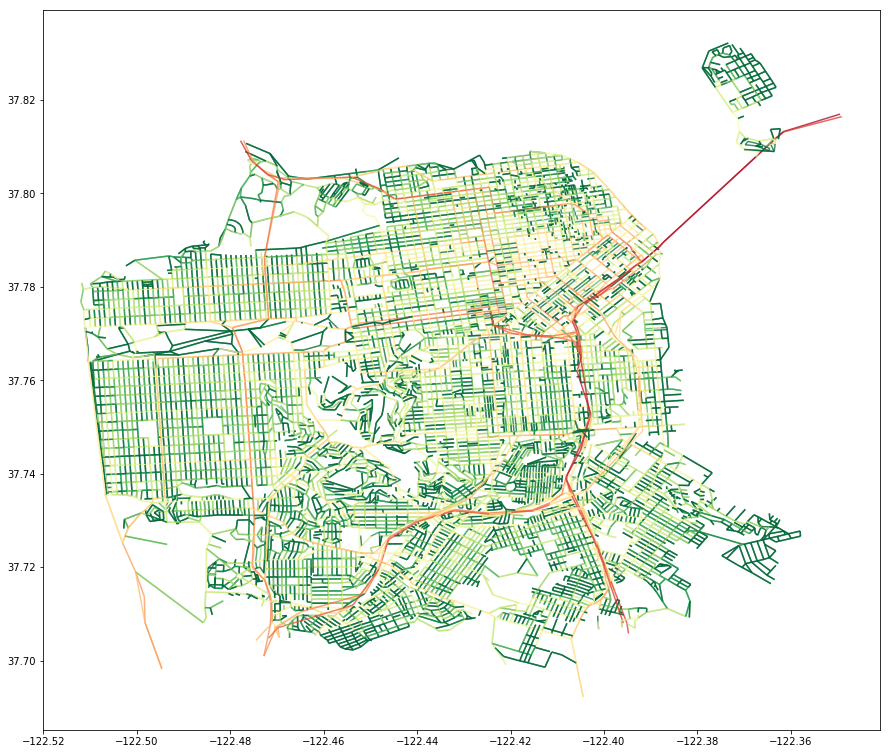

In [46]:

streetvolume.plot(column = 'totalinv_ea', cmap = 'RdYlGn',  figsize = (15,15), alpha = .75)

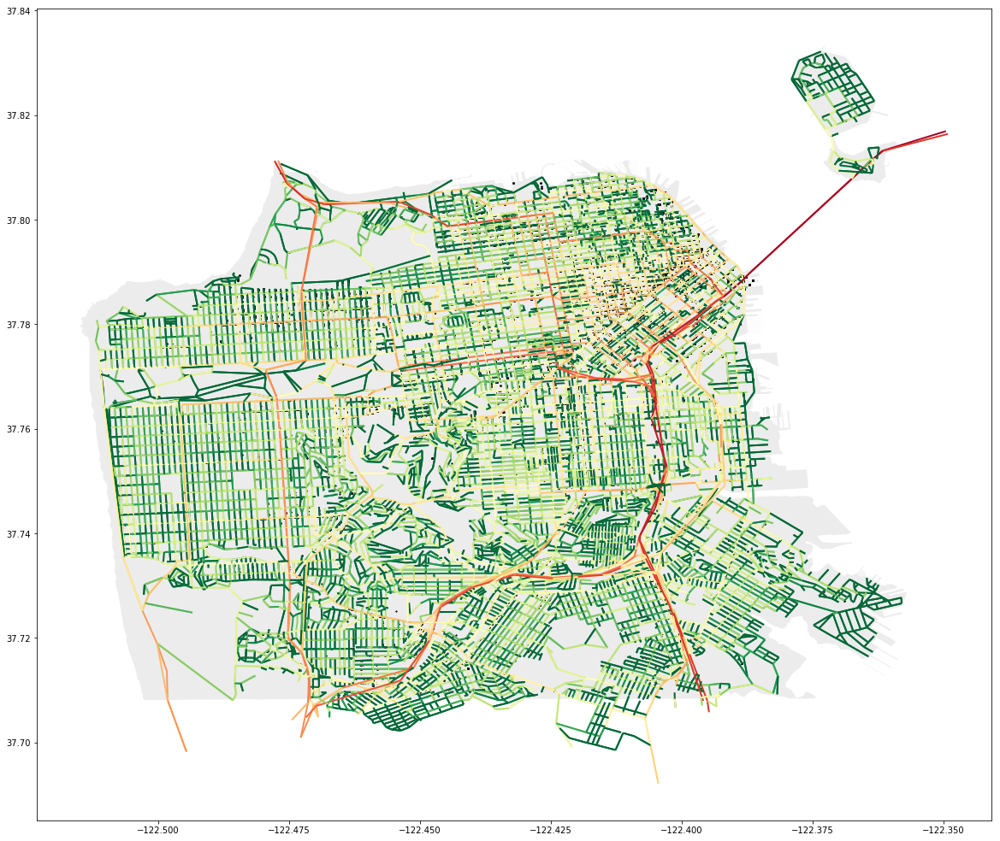

In [67]:
#Now lets plot some tickets against the volume
from shapely.geometry import Point
from geopandas import GeoSeries, GeoDataFrame

def project_to_line(lineid, streetvolume, point):
    df = streetvolume[streetvolume.lineid == lineid]
    line = df['geometry'].iloc[0]
    x = np.array(point.coords[0])

    u = np.array(line.coords[0])
    v = np.array(line.coords[len(line.coords)-1])

    n = v - u
    n /= np.linalg.norm(n, 2)

    npoint = u + n*np.dot(x - u, n)
    npoint = Point(npoint[0], npoint[1]) 
    return npoint

df = result_query('Select * from ticket_data t1 join address_data t2 on t1.address = t2.address limit 50000')
geometry = [Point(xy) for xy in zip(df.lon, df.lat)]
df = df.drop(['lon', 'lat'], axis=1)
crs = {'init': 'epsg:4326'}

gdf = GeoDataFrame(df, crs=crs, geometry=geometry)
gdf['geometry'] = gdf.apply(lambda x: project_to_line(x['lineid'], streetvolume, x['geometry']), axis = 1)
nhoods = gpd.read_file(raw_folder + 'AnalysisNeighborhoods.geojson')

base = streetvolume.plot(column = 'totalinv_ea', cmap = 'RdYlGn',  figsize = (20, 20), alpha =1, linewidth = 2)
gdf.plot(ax = base, marker = "*", color='black', markersize=2);
nhoods.plot(ax = base, alpha = .15, color = 'gray')


In [68]:
gdf

,index,TicketNumber,TickIssueDate,TickIssueTime,ViolationDesc,VehMake,TickRPPlate,TickStreetNo,TickMeter,Agency,...,TotalAmtDue,address,index,address,lineid,nhood,number,street,streetname,geometry
0,0,870546261,2016-07-01 11:37:00,11:37,YEL ZONE,TOYT,6SBL397,721,35907210.0,19.0,...,,721 CLAY ST,2537292,721 CLAY ST,41407.0,Chinatown,721,CLAY ST,CLAY,POINT (-122.4051337806723 37.79441105084242)
1,1,870450711,2016-07-18 15:25:00,15:25,PRK PROHIB,GMC,4ENB173,721,None,19.0,...,,721 CLAY ST,2537292,721 CLAY ST,41407.0,Chinatown,721,CLAY ST,CLAY,POINT (-122.4051337806723 37.79441105084242)
2,2,871982075,2016-08-12 13:14:00,13:14,MTR OUT DT,MISC,81534G1,721,35907210.0,19.0,...,,721 CLAY ST,2537292,721 CLAY ST,41407.0,Chinatown,721,CLAY ST,CLAY,POINT (-122.4051337806723 37.79441105084242)
3,3,871437475,2016-08-24 12:45:00,12:45,MTR OUT DT,MISC,81534G1,721,35907210.0,19.0,...,,721 CLAY ST,2537292,721 CLAY ST,41407.0,Chinatown,721,CLAY ST,CLAY,POINT (-122.4051337806723 37.79441105084242)
4,4,872117260,2016-08-26 15:35:00,15:35,PRK PROHIB,CHRY,7RNX392,721,None,19.0,...,,721 CLAY ST,2537292,721 CLAY ST,41407.0,Chinatown,721,CLAY ST,CLAY,POINT (-122.4051337806723 37.79441105084242)
5,5,872450714,2016-08-31 13:20:00,13:20,YEL ZONE,MINI,7LJC829,721,35907210.0,19.0,...,,721 CLAY ST,2537292,721 CLAY ST,41407.0,Chinatown,721,CLAY ST,CLAY,POINT (-122.4051337806723 37.79441105084242)
6,6,872451716,2016-09-08 11:34:00,11:34,YEL ZONE,DODG,6KOD491,721,35907210.0,19.0,...,,721 CLAY ST,2537292,721 CLAY ST,41407.0,Chinatown,721,CLAY ST,CLAY,POINT (-122.4051337806723 37.79441105084242)
7,7,873458014,2016-09-26 11:29:00,11:29,YEL ZONE,FORD,7MJM431,721,35907210.0,19.0,...,,721 CLAY ST,2537292,721 CLAY ST,41407.0,Chinatown,721,CLAY ST,CLAY,POINT (-122.4051337806723 37.79441105084242)
8,8,873950560,2016-10-13 17:24:00,17:24,PRK PROHIB,LEXU,36293B1,721,None,19.0,...,,721 CLAY ST,2537292,721 CLAY ST,41407.0,Chinatown,721,CLAY ST,CLAY,POINT (-122.4051337806723 37.79441105084242)
9,9,870624926,2016-07-01 07:17:00,07:17,STR CLEAN,SAA,5RLN998,1,None,19.0,...,,1 PALM AVE,1473028,1 PALM AVE,48940.0,Presidio Heights,1,PALM AVE,PALM,POINT (-122.4580452712242 37.78559096082705)


# Data by Meter

In [ ]:
import  re 
meters = result_query("Select TickMeter, count(*) as total_tickets  from ticket_data where TickMeter not in ('None', '0')  group by TickMeter")
meters['valid'] = meters['TickMeter'].apply(lambda x: 0 if len(re.findall('[1-9]', str(x))) == 0  else 1 )
meters = meters[meters.valid == 1]
meters['total_tickets'].describe()

In [ ]:
meters.sort_values(by = 'total_tickets', ascending = False, inplace = True)
meters

In [ ]:
meters['total_tickets'].hist(bins = 'auto', normed = True)

In [ ]:
np.log(meters['total_tickets']).hist(bins = 20, normed = True)

In [ ]:
meter_address = result_query('Select TickMeter, address, count(*) num from ticket_data group by TickMeter, address')

meter_address = meter_address[meter_address.address.isin(address_data['address'])]
meter_address.sort_values(by = 'num', ascending = False)
meter_address.drop_duplicates(subset = 'TickMeter')
meters = meters.merge(meter_address, left_on = 'TickMeter', right_on = 'TickMeter')

In [ ]:
plt.figure(figsize = (10,6))
meters.merge(address_data, left_on = 'address', right_on = 'address').groupby(by = 'nhood')['total_tickets'].mean().plot(kind = 'bar')

Marina has significantly more tickets per metered post. This may be a factor of them being more consistently used, or the aspect that people would be doing more long term activities over there.  

# Data by Officer

In [ ]:
tix_by_officer = result_query("Select strftime('%d-%m-%Y', TickIssueDate)  as datenum, Agency, TickBadgeIssued, "
                              " ViolationDesc, count(*) as total_tickets from ticket_data group by "
                              " strftime('%d-%m-%Y', TickIssueDate), Agency, TickBadgeIssued")

total_tix = tix_by_officer.groupby(by = ['datenum', 'Agency', 'TickBadgeIssued'], as_index = False)['total_tickets'].sum()

In [ ]:
by_officer = total_tix.groupby(by = ['Agency', 'TickBadgeIssued'], as_index = False)['total_tickets'].mean()

In [ ]:
by_officer.sort_values(by = 'total_tickets', ascending = False, inplace = True)

In [ ]:
by_officer['total_tickets'].hist(bins = 20)

In [ ]:
#Lets look at the percentiles of streetvolume
plt.figure(figsize = (10,6))
counts, bin_edges = np.histogram(by_officer['total_tickets'], bins=150, normed=True)
cdf = np.cumsum (counts)
plt.plot(bin_edges[1:], cdf/cdf[-1])
plt.xlabel('Average Tickets Per Day')
plt.ylabel('Cumulative %')
plt.title('Cumulative Distribution of Average Tickets Given Per Day')


85% of them have less than 10 tickets per day, lets take them out

In [ ]:
by_officer[by_officer.total_tickets > 10]['total_tickets'].hist(bins = 'auto')
plt.title('Average tickets given per day by officer')

These guys are most likely just the pack leaders for the street cleaners, jumping in front of everyone and taking all the bait. Let's look at one of them. 

In [ ]:
by_officer[:5]

In [ ]:
ticktype = result_query("Select violationdesc, count(*) total_tickets from ticket_data where TickBadgeIssued = '206'"
                        " and Agency = '19' group by violationdesc")

In [ ]:
plt.pie(ticktype['total_tickets'], labels = ticktype['ViolationDesc'])
;

Yup, Shark